# Optimal probabilistic clustering - Part I
> Clustering is a general class of unsupervised learning tasks with many applications in finance, including portfolio construction, feature selection, regime detection, etc. In part I of this series, I will begin by describing how entropy-based metrics allow for optimal probabilistic clustering as well as the quantification of cluster quality.

- toc: true
- branch: master
- badges: true
- comments: true
- categories: [Clustering, Entropy, Membership Entropy]
- image: images/post_image_optimal_clustering.png
- hide: false
- search_exclude: false
- author: Joao Rodrigues

## Introduction

In this series of articles, I will address the problem of clustering from a generic point of view, beyond the scope of finance and trading applications. In later articles, I will apply the ideas introduced here to problems arising during the systematic investment process.

I will use a probabilistic (fuzzy) clustering framework to develop some of the ideas. Here, instead of assigning each point in the feature space to a definite cluster, a set of membership probabilities $p_x(i)$ are calculated, describing the degree of confidence in assigning point $x$ to cluster $i$.

As with many other clustering techniques, a fundamental problem is to infer the optimal number of clusters, which enters as a free parameter in many of the respective algorithms. I will show that as a by-product of the probabilistic nature of the fuzzy clustering framework, we can define information-theoretic measures about the quality of the clustering and use an entropy minimization argument to infer the optimal number of clusters. I have originally developed these ideas when I was at Imperial College London, in the context of data-driven detection of phases and phase transitions in physical systems made up of only a few particles {% cite Rodrigues2020 %}.

## Optimal clustering 

As mentioned before, within the framework of fuzzy clustering, $p_x(i)$ is the probability of element $x$ belonging to cluster $i$, with $i=1,2,...,k$ and $k$ the total number of clusters. Here, I will estimate these probabilities using the fc-means algorithm {% cite Bezdek2013 %}, implemented in the Python package *fcmeans* {% cite Dias2019 %}. The ideas described here are, however, generic to any probabilistic clustering framework.

From the probabilities $p_x(i)$, I will define the membership entropy

$$S_x(\{ p_x(i) \}) = - \frac{1}{\mathrm{log}(k)} \displaystyle\sum_{i=1}^k p_x(i) \mathrm{log}(p_x(i)),$$

which quantifies the ambiguity in assigning observation $x$ to the available clusters. The least ambiguous case corresponds to $p_x(j) = 1$ and $p_x(i\neq j)=0$ for a given cluster $j$, resulsting in $S_x=0$. On the other hand, a maximally ambiguous configuration $p_x(i) = 1/k$, leads to a maximum membership entropy $S_x=1$. 

The $1/\mathrm{log}(k)$ term normalizes the membership entropy, such that configurations with different numbers of clusters can be correctly compared. This will be needed later to infer the optimal number of clusters.

Lastly, we define the representative cluster as that that, for a given observation $x$, maximizes the subset of probabilities $p_x(i)$. It is thus the most representative cluster associated with $x$.


Let's conduct numerical experiments to demonstrate these ideas.

### Fuzzy clustering and information-theoretic metrics

Let's define a function that calculates the membership probabilities $p_x(i)$ using the *fcmeans* package and calculates the
1. Representative clusters
2. Membership entropy of every observation
3. Total membership entropy (across all observations)

In [1]:
#collapse-show
from fcmeans import FCM

def cluster(n_clusters, features):
    # membership probabilities
    model = FCM(n_clusters=n_clusters).fit(features)
    p = model.u
    # representative cluster
    representative_cluster = np.argmax(p, 1)
    # membership entropy
    Sx = -np.sum(p*np.log(p), 1) / np.log(n_clusters)
    # total membership entropy (across the entire feature space)
    S = np.sum(Sx)        
    
    return p, representative_cluster, Sx, S

### Simulated data

We now generate a sample dataset with 5 clusters of 500 observations in total. Let's generate 3 cases of increasing spread among the observations:

In [2]:
#collapse-show
N = 500
n_clusters = 5
blob_centers = [[0,0], [-1.0,1.0], [-1.0, -1.0], [1.0,-1.0], [1.0,1.0]]
blobs_std = [0.25, 0.35, 0.45]

from sklearn.datasets import make_blobs

X_all = list()
y_all = list()
for std in blobs_std:
    X, y = make_blobs(n_samples=N, centers=blob_centers, cluster_std=[std]*n_clusters, n_features=2, random_state=0)
    X_all.append(X)
    y_all.append(y)

Let's plot the dataset:

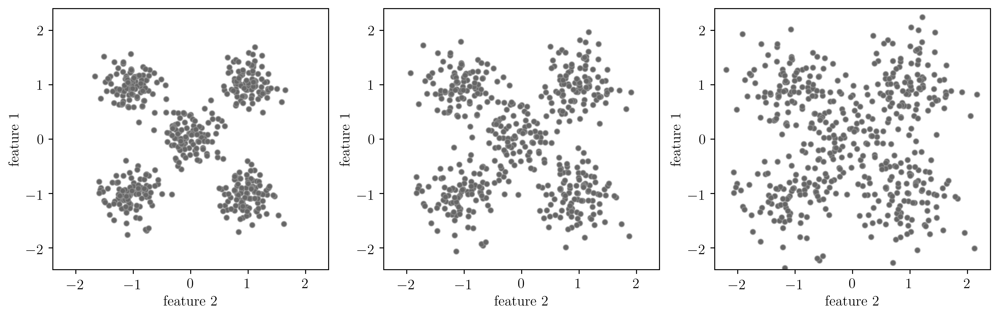

In [3]:
#collapse-hide
import numpy as np 
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rc('text', usetex = True)
font = {'family': 'normal', 'size': 12}
matplotlib.rc('font', **font)
matplotlib.rcParams['figure.dpi']= 1000

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for i, ax in enumerate(axes):
    ax.scatter(X_all[i][:,0], X_all[i][:,1], marker='.', s=80, edgecolor=(0.6,0.6,0.6,0.5), facecolor=(0.4,0.4,0.4))
    ax.set_ylabel('feature 1')
    ax.set_xlabel('feature 2')
    ax.set_xlim([-2.4, 2.4])
    ax.set_ylim([-2.4, 2.4])
    ax.set_xticks([-2, -1, 0, 1, 2])
    ax.set_yticks([-2, -1, 0, 1, 2])
plt.show()

### Membership entropy and optimal number of clusters

As mentioned before, an optimal number of clusters can be inferred as that that minimizes the total membership entropy across our feature space. Let's see how this quantity varies as a function of the number of clusters, for all three cases above:

In [4]:
#collapse-show
n_clusters_trials = np.arange(2, 10, 1)
total_entropies_all = list()
for X in X_all:
    total_entropies = list()
    for n in n_clusters_trials:
        _, _, _, total_entropy = cluster(n_clusters=n, features=X)
        total_entropies.append(total_entropy)
    total_entropies_all.append(total_entropies)

And plotting the results:

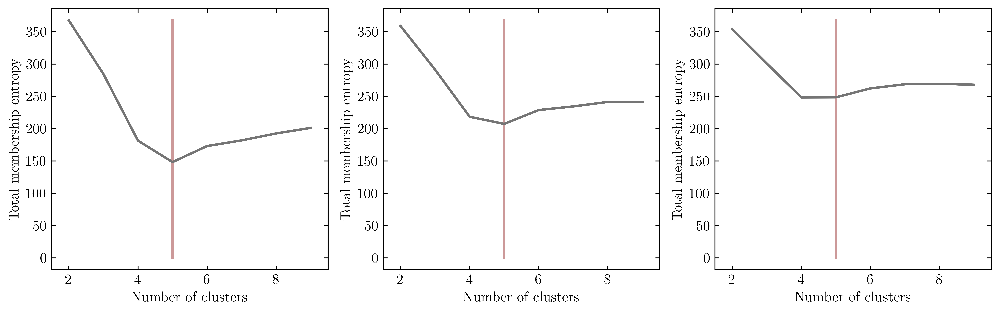

In [5]:
#collapse-hide
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for i, ax in enumerate(axes):
    ax.plot([5, 5], [0, np.max(total_entropies_all)], color=(0.8,0.6,0.6), linewidth=2)
    ax.plot(n_clusters_trials, total_entropies_all[i], color=(0.46,0.46,0.46), linewidth=2)
    ax.set_xlabel('Number of clusters', )
    ax.set_ylabel('Total membership entropy')
    ax.tick_params(axis="both")
    ax.tick_params(direction='in', bottom=True, top=True, left=True, right=True)
    ax.set_xlim([1.5, 9.5])
    ax.set_xscale('linear')
    ax.set_yscale('linear')
plt.show()

Few observations about the results above:
1. The minimization of the membership entropy correctly predicts the number of clusters in case 1 and 2.
2. Case 3 is, according to the membership entropy, equally consistent with 4 and 5 clusters. Indeed, by looking at the previous plot, it is not at all possible to say if the central part is a different cluster and simply the overlap of the 4 outer clusters.
3. The overall membership entropy increases from left to right, quantifying the increasing overlap between clusters.

### Final clustering

Now that we have inferred the optimal number of clusters to be 5, let's perform the final clustering, including collecting the representative cluster of each observation.

In [6]:
#collapse-show
representative_cluster_all = list()
entropies_all = list()
for X in X_all:
    p, representative_cluster, Sx, S = cluster(n_clusters=5, features=X)
    representative_cluster_all.append(representative_cluster)
    entropies_all.append(Sx)

The membership probabilities enclose full information about the clustering. They are however hard to visualize. We can create a lower-dimensional visualization of the results by assigning different colours to different representative clusters. Further, we can assign a transparency level proportional to the membership entropy of each observation, thus gauging a level of ambiguity in assigning it to the available clusters: 

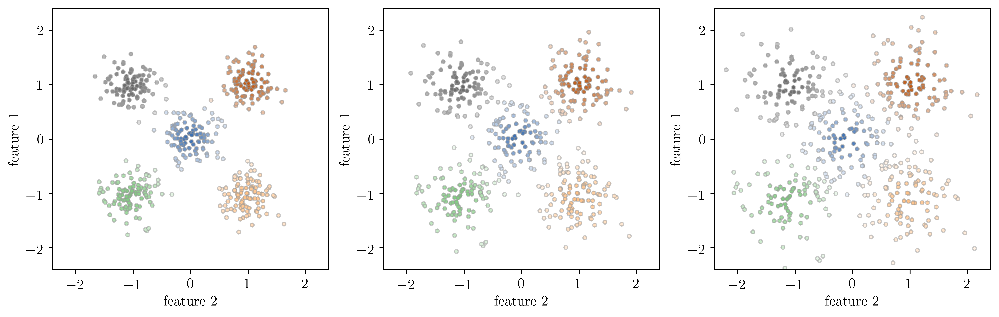

In [7]:
#collapse-hide
### Color handles
def make_rgb_transparent(rgb, alpha):
    bg_rgb = [1, 1, 1]
    return [alpha * c1 + (1 - alpha) * c2 for (c1, c2) in zip(rgb, bg_rgb)]
colormap = matplotlib.cm.get_cmap('Accent')
edgecolors = list()
facecolors = list()
for i in range(0, 5):
    edgecolors.append(make_rgb_transparent(rgb=colormap(1.0*i/(5-1)), alpha=1))
    facecolors.append(make_rgb_transparent(rgb=colormap(1.0*i/(5-1)), alpha=0.65))
    
### Plotting
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for i, ax in enumerate(axes):
    color_seq = list()
    for j in range(0, X_all[i].shape[0]):
        color_seq.append(make_rgb_transparent(edgecolors[representative_cluster_all[i][j]], 1-entropies_all[i][j]))
    ax.scatter(X_all[i][:,0], X_all[i][:,1], marker='.', s=40, edgecolors=(0.6,0.6,0.6,0.5), c=color_seq)
    ax.set_ylabel('feature 1')
    ax.set_xlabel('feature 2')
    ax.set_xlim([-2.4, 2.4])
    ax.set_ylim([-2.4, 2.4])
    ax.set_xticks([-2, -1, 0, 1, 2])
    ax.set_yticks([-2, -1, 0, 1, 2])

As expectable, the membership entropy increases in the regions between clusters.

### Cluster quality

Finally, we can quantify the quality of the different clusters by calculating the intra-cluster mean membership entropy. Let's generate a different dataset to demonstrate this:

In [8]:
#collapse-show
N = 400
blob_centers = [[2, 0], [2*np.cos(2*np.pi/3), 2*np.sin(2*np.pi/3)], [2*np.cos(4*np.pi/3), 2*np.sin(4*np.pi/3)]]
blobs_std = [0.1, 0.3, 0.6]

X, y = make_blobs(n_samples=N, centers=blob_centers, cluster_std=blobs_std, n_features=2, random_state=0)

The dataset is plotted in the figure below. 

Again, inferring the optimal number of clusters by minimizing the membership entropy:

In [9]:
#collapse-show
n_clusters_trials = np.arange(2, 10, 1)
total_entropies = list()
for n in n_clusters_trials:
    _, _, _, total_entropy = cluster(n_clusters=n, features=X)
    total_entropies.append(total_entropy)

The optimal number of clusters is correctly inferred to be 3, shown below. Let's then calculate the final clusters:

In [10]:
p, representative_cluster, Sx, S = cluster(n_clusters=3, features=X)

Plotting all the results:

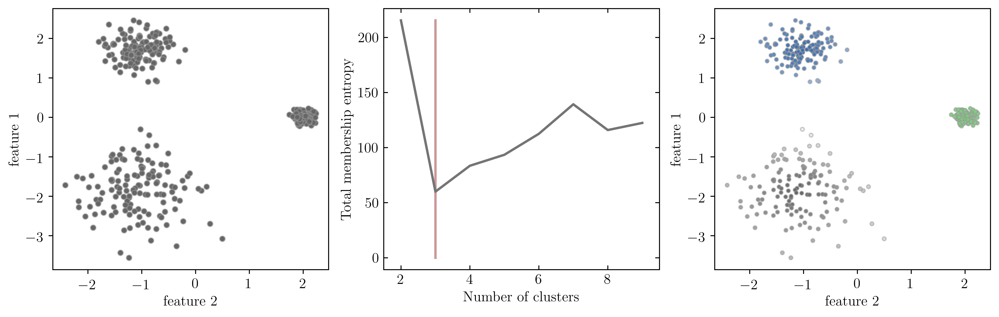

In [11]:
#collapse-hide
### Color handles
edgecolors = list()
facecolors = list()
for i in range(0, 3):
    edgecolors.append(make_rgb_transparent(rgb=colormap(1.0*i/(3-1)), alpha=1))
    facecolors.append(make_rgb_transparent(rgb=colormap(1.0*i/(3-1)), alpha=0.65))

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

### Sample dataset
axes[0].scatter(X[:,0], X[:,1], marker='.', s=80, edgecolor=(0.6,0.6,0.6,0.5), facecolor=(0.4,0.4,0.4))
axes[0].set_ylabel('feature 1')
axes[0].set_xlabel('feature 2')

### Minimization of the total membership entropy
axes[1].plot([3, 3], [0, np.max(total_entropies)], color=(0.8,0.6,0.6), linewidth=2)
axes[1].plot(n_clusters_trials, total_entropies, color=(0.46,0.46,0.46), linewidth=2)
axes[1].set_xlabel('Number of clusters', )
axes[1].set_ylabel('Total membership entropy')
axes[1].tick_params(axis="both")
axes[1].tick_params(direction='in', bottom=True, top=True, left=True, right=True)
axes[1].set_xlim([1.5, 9.5])
axes[1].set_xscale('linear')
axes[1].set_yscale('linear')

### Final clusters
color_seq = list()
for j in range(0, X.shape[0]):
    color_seq.append(make_rgb_transparent(edgecolors[representative_cluster[j]], 1-Sx[j]))
axes[2].scatter(X[:,0], X[:,1], marker='.', s=40, edgecolors=(0.6,0.6,0.6,0.5), c=color_seq)
axes[2].set_ylabel('feature 1')
axes[2].set_xlabel('feature 2')

plt.show()

And finally, calculate the intra-cluster mean membership entropy:

In [12]:
Si = list()
for clust in set(representative_cluster):
    probs = p[np.argmax(p, 1)==clust, :]
    entropy = -np.sum(probs*np.log(probs), 1) / np.log(probs.shape[1])
    Si.append(np.mean(entropy))
    
_=[print("Mean membership entropy across cluster {0} = {1}".format(i, np.round(Si[i], 2))) for i in range(0, len(Si))]

Mean membership entropy across cluster 0 = 0.02
Mean membership entropy across cluster 1 = 0.13
Mean membership entropy across cluster 2 = 0.3


Here, the more robust clusters (higher quality) are those with lower *mean membership entropy*.

## Final notes

1. The *fc-means* algorithm involves minimizing a given loss function. This minimization is not convex and, there is the change of being stuck at a local minimum. In more complex datasets than those generated above, it may be crucial to use different seeds in the initialization of the algorithm and do ensemble statistics over the final results, for instance, in finding the optimal number of clusters.
2. While I have conducted these experiments starting from the fc-means algorithm, the ideas described here can be applied to any other clustering algorithm that performs fuzzy (probabilistic clustering), like Gaussian mixture models, for instance.

In **Part I** of this series, I began by introducing the concept of membership entropy and showed that its minimization across the entire feature space leads to a form of optimal clustering. This has been shown, however, for a "well behaved" and relatively simple dataset.

In **Part II** I will describe some improvements to the current framework, which will allow us to better tackle more complex and inhomogeneous datasets. I will also conduct some systematic experiments to access the performance of the optimal probabilistic clustering concept.

**References:**

{% bibliography --cited %}